In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout


In [3]:
# Load dataset
df = pd.read_csv("air-quality-india.csv")

# Convert Timestamp to datetime
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

# Sort by time
df = df.sort_values('Timestamp')

# Select PM2.5 column
pm25 = df[['PM2.5']].dropna()

print(pm25.head())


    PM2.5
0   64.51
1   69.95
2   92.79
3  109.66
4  116.50


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36192 entries, 0 to 36191
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Timestamp  36192 non-null  datetime64[ns]
 1   Year       36192 non-null  int64         
 2   Month      36192 non-null  int64         
 3   Day        36192 non-null  int64         
 4   Hour       36192 non-null  int64         
 5   PM2.5      36192 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(4)
memory usage: 1.7 MB


In [6]:
df.dtypes

Timestamp    datetime64[ns]
Year                  int64
Month                 int64
Day                   int64
Hour                  int64
PM2.5               float64
dtype: object

In [7]:
df.describe()

,Timestamp,Year,Month,Day,Hour,PM2.5
count,36192,36192.000000,36192.000000,36192.000000,36192.000000,36192.000000
mean,2020-03-02 03:13:40.225464064,2019.682278,6.331841,15.716401,11.477840,49.308429
min,2017-11-07 12:00:00,2017.000000,1.000000,1.000000,0.000000,7.020000
25%,2019-01-16 13:45:00,2019.000000,3.000000,8.000000,5.000000,28.080000
50%,2020-03-13 09:30:00,2020.000000,6.000000,16.000000,11.000000,45.730000
75%,2021-04-12 10:15:00,2021.000000,10.000000,23.000000,17.000000,64.520000
max,2022-06-04 15:00:00,2022.000000,12.000000,31.000000,23.000000,245.630000
std,NaN,1.345011,3.593321,8.859769,6.925088,24.863511


In [8]:
df.columns

Index(['Timestamp', 'Year', 'Month', 'Day', 'Hour', 'PM2.5'], dtype='object')

In [9]:
pd.set_option('display.max_rows',None)
df

,Timestamp,Year,Month,Day,Hour,PM2.5
0,2017-11-07 12:00:00,2017,11,7,12,64.51
1,2017-11-07 13:00:00,2017,11,7,13,69.95
2,2017-11-07 14:00:00,2017,11,7,14,92.79
3,2017-11-07 15:00:00,2017,11,7,15,109.66
4,2017-11-07 16:00:00,2017,11,7,16,116.50
5,2017-11-07 17:00:00,2017,11,7,17,124.21
6,2017-11-07 18:00:00,2017,11,7,18,123.45
7,2017-11-07 19:00:00,2017,11,7,19,120.31
8,2017-11-07 20:00:00,2017,11,7,20,108.75
9,2017-11-07 21:00:00,2017,11,7,21,97.80


In [10]:
pd.reset_option('display.max_rows',None)
df

,Timestamp,Year,Month,Day,Hour,PM2.5
0,2017-11-07 12:00:00,2017,11,7,12,64.51
1,2017-11-07 13:00:00,2017,11,7,13,69.95
2,2017-11-07 14:00:00,2017,11,7,14,92.79
3,2017-11-07 15:00:00,2017,11,7,15,109.66
4,2017-11-07 16:00:00,2017,11,7,16,116.50
...,...,...,...,...,...,...
36187,2022-06-04 11:00:00,2022,6,4,11,35.89
36188,2022-06-04 12:00:00,2022,6,4,12,33.83
36189,2022-06-04 13:00:00,2022,6,4,13,33.05
36190,2022-06-04 14:00:00,2022,6,4,14,35.29


In [11]:
df.isnull().sum()

Timestamp    0
Year         0
Month        0
Day          0
Hour         0
PM2.5        0
dtype: int64

In [12]:
# Normalize Data 
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(pm25)


In [14]:
# Create time series 
def create_sequences(data, time_steps=24):
    X, y = [], []
    for i in range(len(data) - time_steps):
        X.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(X), np.array(y)

TIME_STEPS = 24  # last 24 hours

X, y = create_sequences(scaled_data, TIME_STEPS)


In [15]:
split = int(0.8 * len(X))

X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

print(X_train.shape, X_test.shape)


(28934, 24, 1) (7234, 24, 1)


In [16]:
model = Sequential()

model.add(LSTM(64, return_sequences=True, input_shape=(X_train.shape[1], 1)))
model.add(Dropout(0.2))

model.add(LSTM(64))
model.add(Dropout(0.2))

model.add(Dense(1))

model.compile(optimizer='adam', loss='mse')

model.summary()


C:\Users\Shubham\AppData\Local\Programs\Python\Python313\Lib\site-packages\keras\src\layers\rnn\rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                          │ (None, 24, 64)              │          16,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 24, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 64)                  │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 49,985 (195.25 KB)

 Trainable params: 49,985 (195.25 KB)

 Non-trainable params: 0 (0.00 B)

In [17]:
predictions = model.predict(X_test)

# Inverse scaling
predictions = scaler.inverse_transform(predictions)
y_test_actual = scaler.inverse_transform(y_test)


227/227 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step


In [18]:
mae = mean_absolute_error(y_test_actual, predictions)
rmse = np.sqrt(mean_squared_error(y_test_actual, predictions))

print("MAE:", mae)
print("RMSE:", rmse)


MAE: 37.80845230373587
RMSE: 42.69010754820801


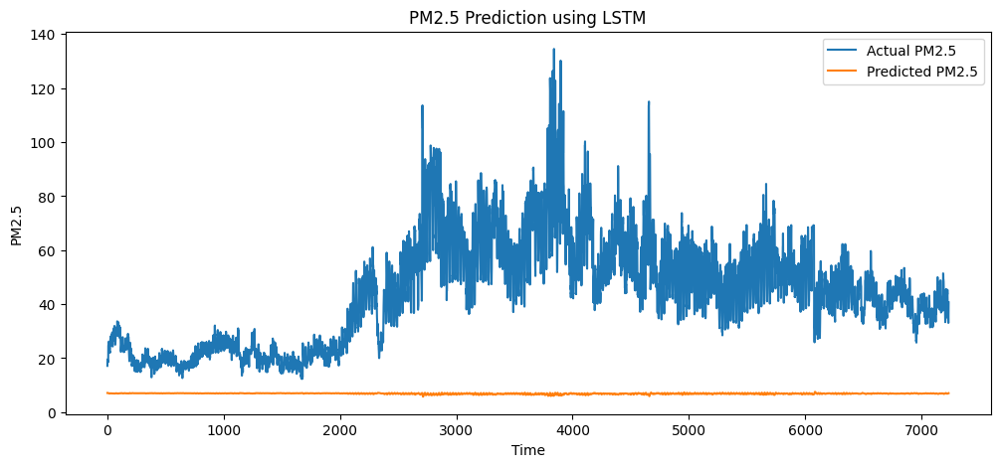

In [19]:
plt.figure(figsize=(12,5))
plt.plot(y_test_actual, label="Actual PM2.5")
plt.plot(predictions, label="Predicted PM2.5")
plt.title("PM2.5 Prediction using LSTM")
plt.xlabel("Time")
plt.ylabel("PM2.5")
plt.legend()
plt.show()
